In [2]:
#loading external libraries, predefined functions etc. in a seperate script for a cleaner notebook
from Co2_setup import * 

# Machine Learning Using All Descriptors

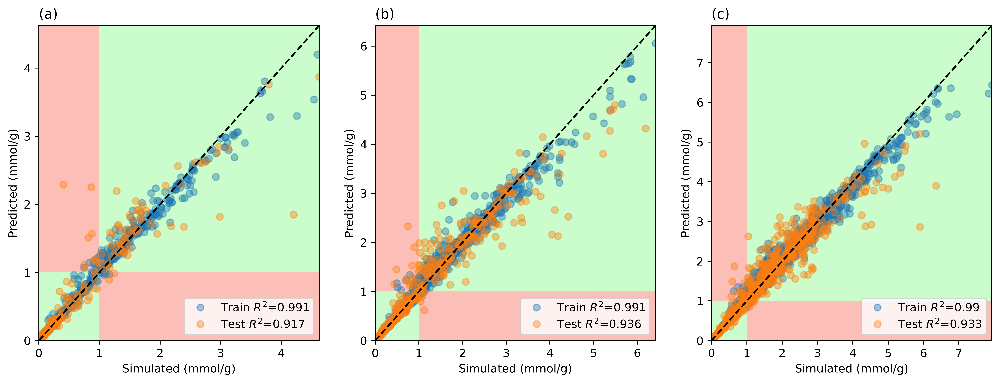

In [3]:
all_desc_pc = {}

all_desc_pc['1 mmol/g'] = {}
fig, ax = plt.subplots(1,3,dpi=700,figsize = (15,5))

X,y = X_y_from_pressure(df,40)
all_desc_pc['1 mmol/g']['40Pa'] = evaluate_ML(ml,X,y,ax[0],"(a)")

X,y = X_y_from_pressure(df,1000)
all_desc_pc['1 mmol/g']['1000Pa'] = evaluate_ML(ml,X,y,ax[1],"(b)")

X,y = X_y_from_pressure(df,4000)
all_desc_pc['1 mmol/g']['4000Pa'] = evaluate_ML(ml,X,y,ax[2],"(c)")

# Excluding Henry Coeff from Descriptors

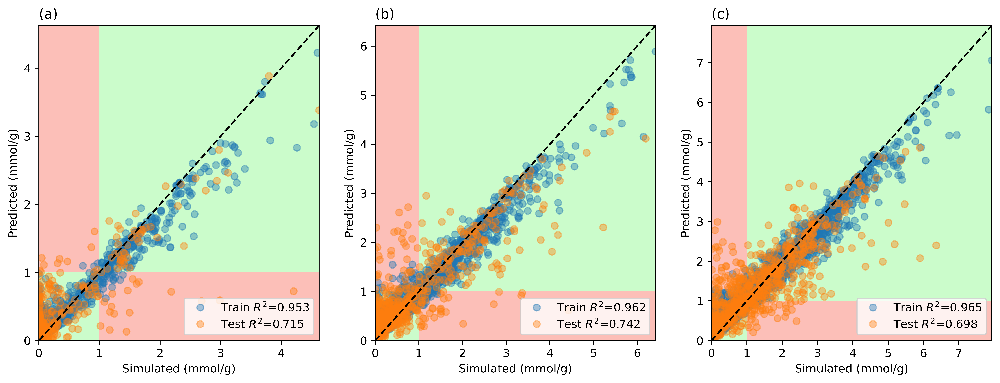

In [4]:
non_energ_pc = {}

non_energ_pc['1 mmol/g'] = {}
fig, ax = plt.subplots(1,3,dpi=700,figsize = (15,5))

X,y = X_y_from_pressure(df,40,non_energetic_descriptors)
non_energ_pc['1 mmol/g']['40Pa'] = evaluate_ML(ml,X,y,ax[0],"(a)")

X,y = X_y_from_pressure(df,1000,non_energetic_descriptors)
non_energ_pc['1 mmol/g']['1000Pa'] = evaluate_ML(ml,X,y,ax[1],"(b)")

X,y = X_y_from_pressure(df,4000,non_energetic_descriptors)
non_energ_pc['1 mmol/g']['4000Pa'] = evaluate_ML(ml,X,y,ax[2],"(c)")

# Feature Importances (without the Henry Coefficient)

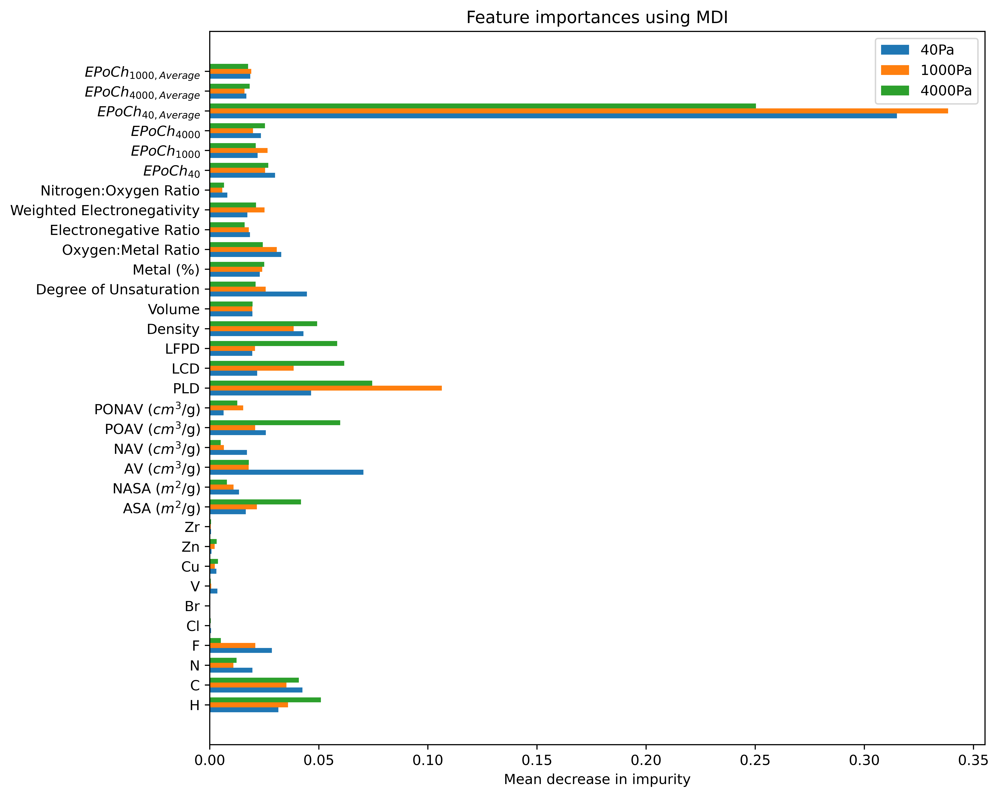

In [5]:
feature_importance_figure1()

# Feature Importances (All Descriptors)

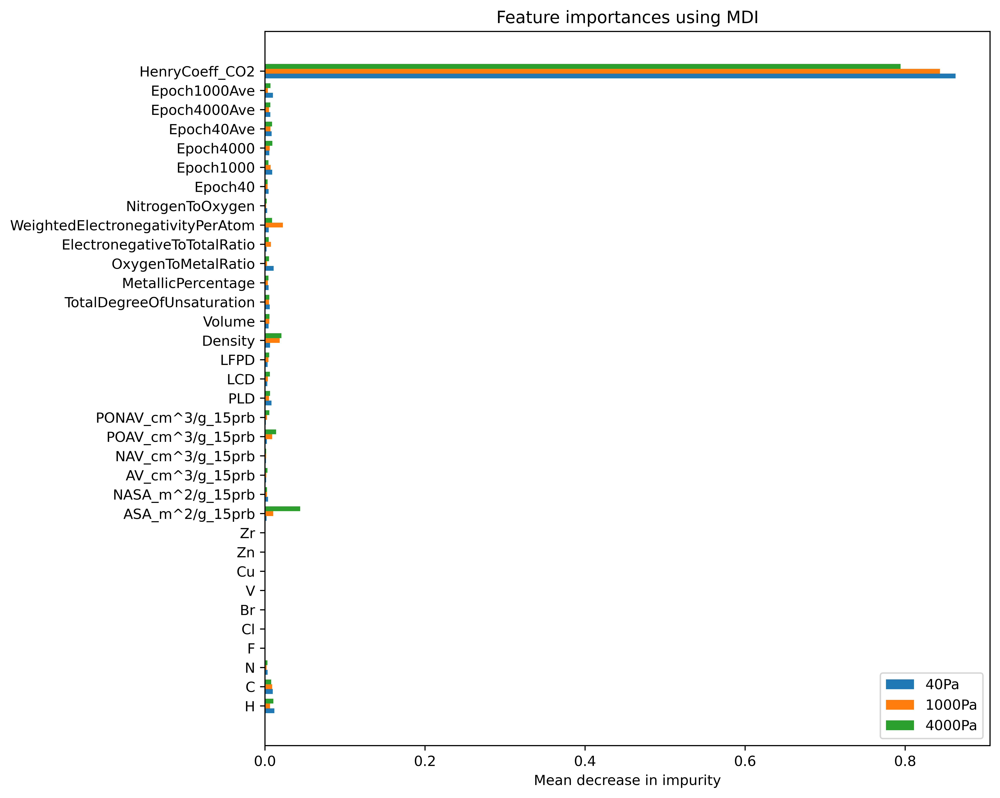

In [6]:
feature_importance_figure2()

# Comparing Feature Groups

In [7]:
pressures = [40,1000,4000]

Summary = {"Pressure":[], "Features":[], "R2": [], "RMSE":[]}

print("Pressure,Features,R2(Train),RMSE(Train), R2(Test),RMSE(Test), ")
for P in pressures:
    current = df[df.Pressure == P]
    X_train_intermediate, X_test_intermediate, y_train, y_test = train_test_split(current, current['Uptake'], test_size=0.2,random_state = SEED) 

    for combination in combinations:
        feats = combinations[combination]
        X_train, X_test =X_train_intermediate[feats], X_test_intermediate[feats]
        ml.fit(X_train,y_train)
        test_pred   = ml.predict(X_test)
        test_r2     = r2_score(y_test,test_pred)
        train_pred  = ml.predict(X_train)
        train_r2    = r2_score(y_train,train_pred)
        rmse        = mean_squared_error(y_test,test_pred)**.5
        train_rmse  = mean_squared_error(y_train,train_pred)**.5
        Summary['Pressure'].append(P)
        Summary['Features'].append(combination)
        Summary['R2'].append(test_r2)
        Summary['RMSE'].append(rmse)
        print(f"{P:<10}   {combination:<12}   {train_r2:<5.4f}   {train_rmse:<5.4f}   {test_r2:<5.4f}   {rmse:<5.4f}")
        
Summary['Timings'] = []
for i in Summary['Features']:
    Summary['Timings'].append(TPF[i])
    
s = pd.DataFrame(Summary)

Pressure,Features,R2(Train),RMSE(Train), R2(Test),RMSE(Test), 
40           A+B+C          0.9331   0.1363   0.5143   0.3629
40           A+B+C+D        0.9532   0.1140   0.7147   0.2781
40           A+B+C+E        0.9913   0.0491   0.9164   0.1505
40           All            0.9912   0.0494   0.9172   0.1498
1000         A+B+C          0.9446   0.2210   0.6499   0.5920
1000         A+B+C+D        0.9624   0.1820   0.7424   0.5079
1000         A+B+C+E        0.9910   0.0890   0.9391   0.2469
1000         All            0.9909   0.0894   0.9358   0.2536
4000         A+B+C          0.9485   0.2821   0.6232   0.7096
4000         A+B+C+D        0.9649   0.2330   0.6976   0.6357
4000         A+B+C+E        0.9902   0.1233   0.9299   0.3060
4000         All            0.9903   0.1227   0.9325   0.3003


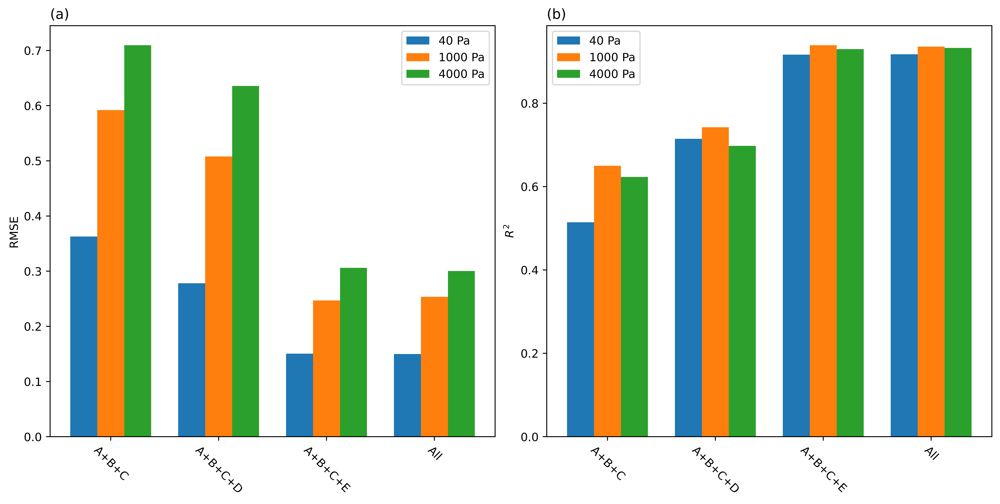

In [8]:
show_RMSE_and_R2_metrics(s)